# Pyritisation of Shelly Fossils
### *By Peter Methley*

## Data Amalgamation
This notebook brings together the iron speciation and sulphur isotope data for combined analysis. A combined table with all the data is output to `./Data/Log_data.csv`.

In [1]:
# Import libraries
import pandas as pd
import numpy as np
import ipywidgets as wdg
from plotly_default import go, graph_config, sel_trace
from plotly.subplots import make_subplots
from PIL import Image

In [2]:
# Import iron speciation data
spec_raw = pd.read_csv('Data/Fe_speciation.csv')

# spec_raw.sort_values(['height', 'name'], inplace=True)

# spec_raw.drop(columns='duplicate', inplace=True)

# spec_raw

In [3]:
# Import qualitative data
qual_df = pd.read_csv('./Data/Qualitative_info.csv')
# qual_df

In [4]:
# Process S isotope data
S_corrected = pd.read_csv('Data/S_isotopes_processed_v2.csv')

# Remove standards, sort and remove unnecessary columns. d34S is now the corrected value.
# S_corrected = S_corrected[S_corrected.data_type != 'standard'].sort_values(['height', 'name']).loc[:,['name', 'd34S_corrected', 'd34S_err']].rename(columns={'d34S_corrected': 'd34S'})
# This is now done in S_Isotopes_v2.ipynb

# Add KC-2-30 (which wasn't run in the mass spec but we still have other data for it)
S_corrected = S_corrected.append({'name': 'KC-2-30', 'd34S': np.nan}, ignore_index=True)

# S_corrected

In [5]:
C_N_df = pd.read_csv('Data/C_N_raw.csv')
# C_N_df

In [6]:
CaCO3_df = pd.read_csv('Data/Carbonate_Rough.csv')
CaCO3_df['CaCO3_err'] = CaCO3_df.CaCO3_err.fillna(0)
# CaCO3_df

In [7]:
log_df = spec_raw.merge(S_corrected, on='name').merge(C_N_df, on='name').merge(CaCO3_df, on='name').merge(qual_df, on='name')
# log_df

In [8]:
# Calculate Fe Speciation ratios

log_df.eval('Fe_HR = Fe_carb + Fe_ox + Fe_mag + Fe_py', inplace=True)
log_df.eval('Fe_UR = Fe_tot - Fe_HR', inplace=True)
log_df.eval('HR_to_tot = Fe_HR / Fe_tot', inplace=True)
log_df.eval('py_to_HR = Fe_py / Fe_HR', inplace=True)
log_df.eval('py_to_tot = Fe_py / Fe_tot', inplace=True)

# calculate diagenesis time with d_py = 0.12 wt% per ka and no initial pyrite
# log_df.eval('dia_time = Fe_HR*(py_to_HR - 0)/0.12' ,inplace=True) This is just proportional to Fe_py

log_df.eval('H2S_decay = 1/Fe_py', inplace=True)

In [9]:
# Calculate errors

Fe_spec_errors = pd.read_csv('./Data/Fe_Spec_Errors.csv')

for d in Fe_spec_errors.iterrows():
    head = d[1].species
    RSD = d[1].RSD
    log_df.eval(f'{head}_err = {head} * {RSD}', inplace=True)

log_df.eval('Fe_HR_err = (Fe_carb_err**2 + Fe_ox_err**2 + Fe_mag_err**2 + Fe_py_err**2)**0.5', inplace=True)
log_df.eval('Fe_UR_err = (Fe_tot_err**2 + Fe_HR_err**2)**0.5', inplace=True)
log_df.eval('HR_to_tot_err = HR_to_tot * ((Fe_HR_err / Fe_HR)**2 + (Fe_tot_err / Fe_tot)**2)**0.5', inplace=True)
log_df.eval('py_to_HR_err = py_to_HR * ((Fe_py_err / Fe_py)**2 + (Fe_HR_err / Fe_HR)**2)**0.5', inplace=True)
log_df.eval('py_to_tot_err = py_to_tot * ((Fe_py_err / Fe_py)**2 + (Fe_tot_err / Fe_tot)**2)**0.5', inplace=True)

# Errors in C and N
log_df['TN_err'] = 0.5
log_df['TOC_err'] = 0.5
log_df['d13Corg_err'] = 0.1

In [10]:
log_df.to_csv('./Data/Log_data_combined.csv')

# log_df

In [11]:
log_data = log_df[log_df.category.isin(['Mudstone', 'Carbonate'])]
extra_data = log_df[log_df.category.isin(['Pervasively pyritised regions', 'Bed 22'])]

# species_types = pd.DataFrame({'header': ['d34S', 'HR_to_tot', 'py_to_HR', 'Fe_tot', 'Fe_py', 'Fe_HR', 'Fe_ox', 'Fe_mag', 'Fe_carb', 'Fe_UR'],
#            'label': ['δ<sup>34</sup>S (‰)', '[Fe<sub>HR</sub>]/[Fe<sub>tot</sub>]', '[Fe<sub>py</sub>]/[Fe<sub>HR</sub>]', '[Fe<sub>tot</sub>] (wt%)', '[Fe<sub>py</sub>] (wt%)', '[Fe<sub>HR</sub>] (wt%)', '[Fe<sub>ox</sub>] (wt%)', '[Fe<sub>mag</sub>] (wt%)', '[Fe<sub>carb</sub>] (wt%)', '[Fe<sub>UR</sub>] (wt%)'],
#            'colour': ['GoldenRod', 'LightSkyBlue', 'DarkGreen', 'Tomato', 'MediumSeaGreen', 'DarkOrange', 'FireBrick', 'RoyalBlue', 'Purple', 'SlateGrey']})

species_types=pd.read_csv('./Data/Species_types.csv')

species_types#.to_csv('./Data/Species_types.csv')

,header,label,colour
0,HR_to_tot,[Fe<sub>HR</sub>]/[Fe<sub>tot</sub>],OrangeRed
1,py_to_HR,[Fe<sub>py</sub>]/[Fe<sub>HR</sub>],Orange
2,py_to_tot,[Fe<sub>py</sub>]/[Fe<sub>tot</sub>],LightGreen
3,Fe_py,[Fe<sub>py</sub>] (wt%),Green
4,Fe_ox,[Fe<sub>ox</sub>] (wt%),FireBrick
5,Fe_mag,[Fe<sub>mag</sub>] (wt%),RoyalBlue
6,Fe_carb,[Fe<sub>carb</sub>] (wt%),Purple
7,Fe_UR,[Fe<sub>UR</sub>] (wt%),SlateGrey
8,Fe_HR,[Fe<sub>HR</sub>] (wt%),DarkOrange
9,Fe_tot,[Fe<sub>tot</sub>] (wt%),Tomato


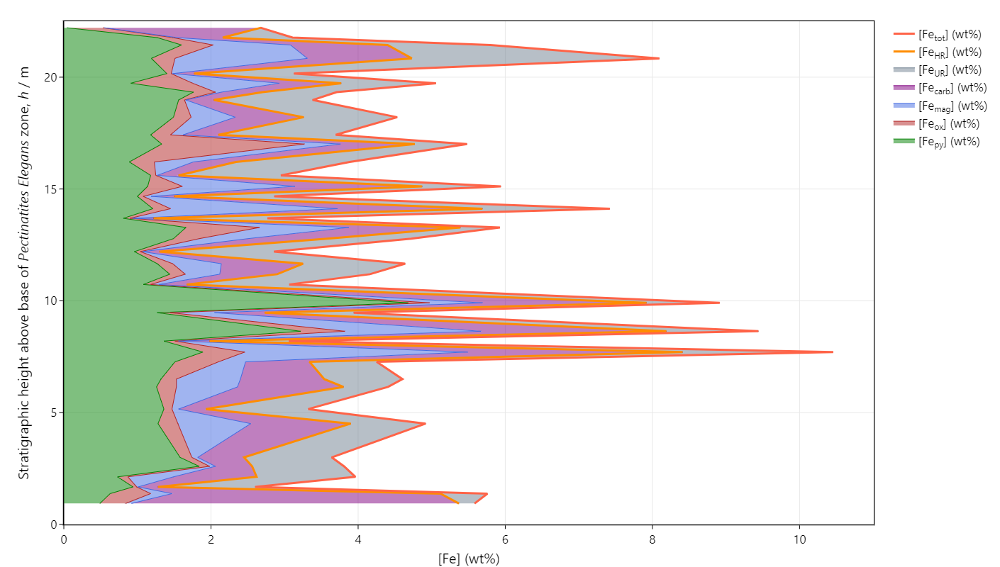

In [12]:
v_log = go.Figure()

for species in species_types.iterrows(): # Selecting only iron speciation
    
    if species[1].header in ['Fe_py', 'Fe_ox', 'Fe_mag', 'Fe_carb', 'Fe_UR']:
        v_log.add_trace(go.Scatter(x=log_data[species[1].header],
                                   y=log_data['height'],
                                   name=species[1].label,
                                   line_color=species[1].colour,
                                   text=log_data['name'],
                                   mode='lines',
                                   stackgroup='one',
                                   orientation='h',
                                   line_width=1))
    
    elif species[1].header in ['Fe_tot', 'Fe_HR']:
        v_log.add_trace(go.Scatter(x=log_data[species[1].header],
                                   y=log_data['height'],
                                   name=species[1].label,
                                   line_color=species[1].colour,
                                   text=log_data['name'],
                                   mode='lines',
                                   line_width=3))


v_log.update_layout(xaxis_title = '[Fe] (wt%)',
                    yaxis_title = 'Stratigraphic height above base of <i>Pectinatites Elegans</i> zone, <i>h</i> / m',
                    xaxis_rangemode = 'tozero',
                    yaxis_rangemode = 'tozero',
                    hovermode = 'y',
                    width = 700,
                    height = 800,
                    yaxis_range = [0, 22.5]
                    )

v_log.show(config=graph_config)

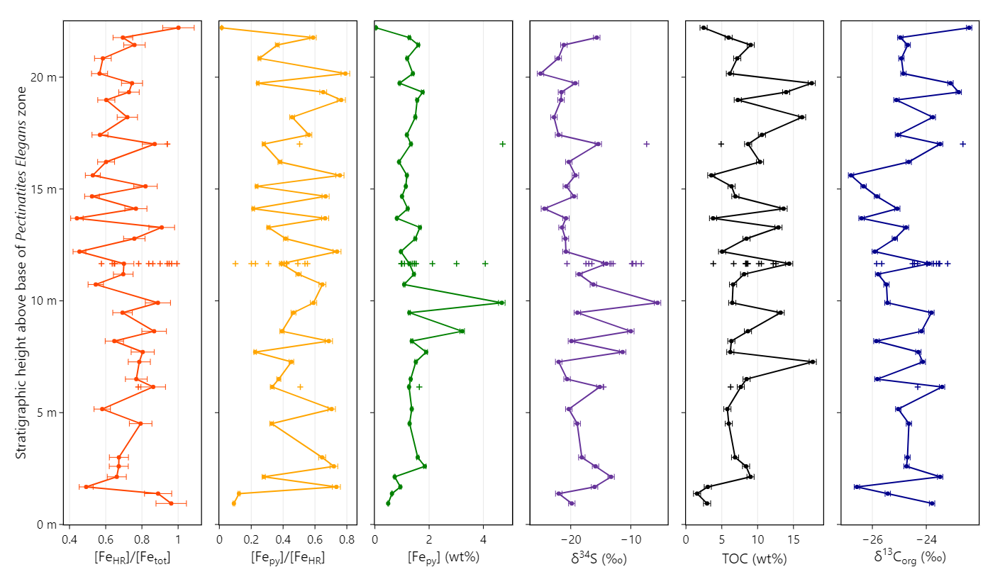

In [13]:
plot_species_types = species_types[[h in ['HR_to_tot', 'py_to_HR', 'Fe_py', 'd34S', 'TOC', 'd13Corg'] for h in species_types.header]]

separate_logs = make_subplots(rows=1, cols=plot_species_types.shape[0],
                              shared_yaxes=True, horizontal_spacing=0.02)

err_base = {'type': 'data', 'thickness': 1} # Error bars

def axis_mode(species):
    if species.startswith('Fe') or species.startswith('py_to') or species.startswith('T'):
        return 'tozero'
    else:
        return 'normal'

col_counter = 0
for species in plot_species_types.iterrows():
    col_counter += 1
    
    # Plot main sequence
    separate_logs.add_trace(go.Scatter(x=log_data[species[1].header],
                               error_x = {**err_base, 'array': log_data[species[1].header+'_err']},
                               y=log_data['height'],
                               name=species[1].label,
                               text=log_data['name'],
                               line_color=species[1].colour,
                               mode='lines+markers'),
                               row=1, col=col_counter)
    
    # Plot extra data
    separate_logs.add_trace(go.Scatter(x=extra_data[species[1].header],
                               #error_x = {**err_base, 'array': extra_data[species[1].header+'_err']},
                               y=extra_data['height'],
                               name=species[1].label,
                               text=extra_data['name'],
                               line_color=species[1].colour,        
                               marker_line_color=species[1].colour,
                               marker_line_width=1.5,
                               mode='markers',
                               marker_symbol='cross-thin'),
                               row=1, col=col_counter) 
    
    # Label x axis
    separate_logs.update_xaxes(title_text = species[1].label,
                               row=1, col=col_counter)
    
    # Only concentration axes should go to zero
    # if species[1].header.startswith('Fe') or species[1].header.startswith('py_to') or species[1].header.startswith('T'):
    separate_logs.update_xaxes(row=1, col=col_counter, rangemode=axis_mode(species[1].header))
    
    # Fix y axis range
    separate_logs.update_yaxes(rangemode='tozero', row=1, col=col_counter, showgrid=False)

separate_logs.update_yaxes(title_text='Stratigraphic height above base of <i>Pectinatites Elegans</i> zone',
                           rangemode='tozero', row=1, col=1)
    
separate_logs.update_layout(
                    height = 800,
                    width = 180*plot_species_types.shape[0],
                    showlegend = False,
                    # font_size=14,
                    yaxis_range = [0,22.5],
                    yaxis_ticksuffix=' m')

separate_logs.update_xaxes(dtick=10, row=1, col=4)

# separate_logs.write_image('Images/separate_logs.svg')
# separate_logs.write_html('Interactives/separate_logs.html', include_plotlyjs='cdn')
# separate_logs.write_image('Images/separate_logs.png', scale=3)

separate_logs.show(config=graph_config)

In [14]:
# separate_logs.write_image('./images/separate_logs_3.svg', engine='kaleido')

In [15]:
try:
    log_df.insert(loc=9, column='Constant', value=1) #
except ValueError:
    pass # do nothing if column already exists

data_types = species_types.append(pd.DataFrame({'header': ['Constant', 'height'], 'label': ['', '<i>h</i> / m']}), ignore_index=True, sort=False)

In [16]:
# categories = list(set(log_df.category))
# categories = ['Stratigraphic sequence', 'Pervasively pyritised regions', 'Bed 22']
cat_symbols = {'Mudstone': 'circle',
               'Carbonate': 'star',
               'Pervasively pyritised regions': 'square',
               'Bed 22': 'diamond'}
categories = list(cat_symbols.keys())

def init_biv_plot():
    plot = go.FigureWidget()
    
    for category in categories:   
        plot.add_trace(go.Scatter(mode='markers',
                                  marker_line={'color': 'Black', 'width': 1},
                                  marker_symbol=cat_symbols[category],
                                  marker_coloraxis='coloraxis',
                                  name=category))
        
    # Add diagonal line
    plot.add_shape(type='line', x0=-100, y0=-100, x1=100, y1=100, visible=False, line_width=0.5, name='Diagonal')

    plot.update_layout(height=700, width=740,
                       legend=dict(orientation="h",
                                   yanchor="bottom",
                                   y=1.01,
                                   xanchor="left",
                                   x=0,
                                   itemsizing='constant'),
                       coloraxis=dict(colorscale='viridis_r', colorbar_ticks='outside'))
    
    return plot

axis_options = list(data_types.header)
size_options = [i for i in axis_options if i != 'd34S']

base_errorbar = dict(type='data', thickness=1, color='DarkGrey')


def update_biv_traces(x, y, colour, size, diagonal, plot_errors, plot):
    
    with plot.batch_update():

        for category in categories:
            cat_df = log_df[log_df.category == category]

            if plot_errors:
                x_errorbars = {**base_errorbar, 'array': cat_df[x+'_err']}
                y_errorbars = {**base_errorbar, 'array': cat_df[y+'_err']}
            else:
                x_errorbars = None
                y_errorbars = None

            graph_texts = []
            for d in cat_df.iterrows():
                graph_texts.append(d[1]['name'] + '<br>' +
                                   data_types.loc[data_types.header==size, 'label'].iloc[0] + ': {:.2f}<br>'.format(d[1][size]) +
                                   data_types.loc[data_types.header==colour, 'label'].iloc[0] + ': {:.2f}'.format(d[1][colour]))

            cat_trace = sel_trace(plot, category)
            cat_trace.x=cat_df[x]
            cat_trace.y=cat_df[y]
            cat_trace.error_x=x_errorbars
            cat_trace.error_y=y_errorbars
            cat_trace.marker.size=cat_df[size]
            cat_trace.marker.sizemin=4
            cat_trace.marker.sizeref=3*np.mean(log_df[size]/(6.**2))
            cat_trace.marker.color=cat_df[colour]
            cat_trace.text=graph_texts


        if diagonal:
            line_bottom_left = min(log_df[x].min(), log_df[y].min())
            line_top_right = max(log_df[x].max(), log_df[y].max())
            plot.update_shapes(selector=dict(name='Diagonal'),
                               visible=True, x0 = line_bottom_left, y0 = line_bottom_left,
                               x1 = line_top_right, y1 = line_top_right)
        else:
            plot.update_shapes(selector=dict(name='Diagonal'), visible=False)
            
    
        # Only concentration axes should go to zero
        plot.layout.xaxis.rangemode = axis_mode(x)
        plot.layout.yaxis.rangemode = axis_mode(y)

        plot.layout.xaxis.title = data_types.loc[data_types.header==x, 'label'].iloc[0]
        plot.layout.yaxis.title = data_types.loc[data_types.header==y, 'label'].iloc[0]
        plot.layout.coloraxis.colorbar.title = data_types.loc[data_types.header==colour, 'label'].iloc[0]

In [17]:
# Customisable bivariate plot
biv_plot = init_biv_plot()

wdg.interact(update_biv_traces,
             x=wdg.Dropdown(options=axis_options, value='Fe_py'),
             y=wdg.Dropdown(options=axis_options, value='d34S'),
             colour=wdg.Dropdown(options=axis_options, value='height'),
             size=wdg.Dropdown(options=size_options, value='Constant'),
             diagonal=False,
             plot_errors=False,
             plot=wdg.fixed(biv_plot));

biv_plot

interactive(children=(Dropdown(description='x', index=3, options=('HR_to_tot', 'py_to_HR', 'py_to_tot', 'Fe_py…

FigureWidget({
    'data': [{'error_x': {},
              'error_y': {},
              'marker': {'color': arr…

In [18]:
# Customisable bivariate plot
biv_plot_2 = init_biv_plot()

wdg.interact(update_biv_traces,
             x=wdg.Dropdown(options=axis_options, value='Fe_py'),
             y=wdg.Dropdown(options=axis_options, value='d34S'),
             colour=wdg.Dropdown(options=axis_options, value='height'),
             size=wdg.Dropdown(options=size_options, value='Constant'),
             diagonal=False,
             plot_errors=False,
             plot=wdg.fixed(biv_plot_2));

biv_plot_2

interactive(children=(Dropdown(description='x', index=3, options=('HR_to_tot', 'py_to_HR', 'py_to_tot', 'Fe_py…

FigureWidget({
    'data': [{'error_x': {},
              'error_y': {},
              'marker': {'color': arr…

In [19]:
# import plotly.io as pio
# pio.write_json(biv_plot, './Interactives/biv_plot1.plotly.json')

In [20]:
# Fe speciation plot
spec_plot=init_biv_plot()
spec_plot.update_layout(xaxis_range=[0,1], yaxis_range=[0,1])
spec_plot.add_hline(0.8, line_width=1, line_dash='dash')
spec_plot.add_vline(0.38, line_width=1, line_dash='dash')

wdg.interact(update_biv_traces,
             x=wdg.fixed('HR_to_tot'),
             y=wdg.fixed('py_to_HR'),
             colour=wdg.Dropdown(options=axis_options, value='d34S'),
             size=wdg.Dropdown(options=size_options, value='Constant'),
             diagonal=wdg.fixed(False),
             plot_errors=False,
             plot=wdg.fixed(spec_plot));

spec_plot

interactive(children=(Dropdown(description='colour', index=10, options=('HR_to_tot', 'py_to_HR', 'py_to_tot', …

FigureWidget({
    'data': [{'error_x': {},
              'error_y': {},
              'marker': {'color': arr…

In [21]:
# spec_plot.write_image('./images/spec_plot_1.svg')

In [22]:
sample_locs = pd.read_csv('./Data/Series3_Coords.csv')

series3_df = sample_locs.merge(log_df, on='name').drop(columns=['category'])

In [23]:
series3_plot = go.FigureWidget()

series3_plot.add_trace(go.Scatter(x=series3_df.x, y=series3_df.y, text=series3_df.name,
                                  mode='markers', marker_line={'color':'white', 'width':2},
                                  marker_colorscale='viridis_r', marker_opacity=1))

red_patch_png = Image.open('./Images/red_patch.png')

series3_plot.add_layout_image(dict(source=red_patch_png,
                              xref='x', yref='y',
                              x=0, y=0,
                              sizex=red_patch_png.size[0], sizey=red_patch_png.size[1],
                              layer='below'))

series3_plot.update_layout(xaxis_range=[0, red_patch_png.size[0]],
                           yaxis_range=[-red_patch_png.size[1], 0],
                           xaxis_showgrid=False,
                           yaxis_showgrid=False,
                           xaxis_showticklabels=False,
                           yaxis_showticklabels=False,
                           xaxis_ticks='',
                           yaxis_ticks='',
                           xaxis_scaleanchor = 'y',
                           yaxis_constrain='domain',
                           width=1000,
                           height=800)

@wdg.interact(colour=wdg.Dropdown(options=axis_options, value='d34S'),
              size=wdg.Dropdown(options=size_options, value='Fe_carb'))
def update_series3_traces(colour, size):
    
    with series3_plot.batch_update():
        
        graph_texts = []
        for d in series3_df.iterrows():
            graph_texts.append(d[1]['name'] + '<br>' +
                               data_types.loc[data_types.header==size, 'label'].iloc[0] + ': ' + str(d[1][size]) + '<br>' +
                               data_types.loc[data_types.header==colour, 'label'].iloc[0] + ': ' + str(d[1][colour]))

        s3trace = series3_plot.data[0]
        s3trace.marker.size=series3_df[size]
        s3trace.marker.sizemin=4
        s3trace.marker.sizeref=3*np.mean(log_df[size]/(6.**2))
        s3trace.marker.color=series3_df[colour]
        s3trace.marker.colorbar.title=data_types.loc[data_types.header==colour, 'label'].iloc[0]
        s3trace.text=graph_texts
    

series3_plot

interactive(children=(Dropdown(description='colour', index=10, options=('HR_to_tot', 'py_to_HR', 'py_to_tot', …

FigureWidget({
    'data': [{'marker': {'color': array([-14.51986922, -12.95588117,  -8.23962171,  -9.67204806…

In [24]:
# series3_plot.write_image('./images/bed22plot.svg')